# Цель: 
разработать модель (бинарный классификатор на основе сверточной нейронной сети (CNN)), определяющую наличие или отсутствие глазного заболевания по изображению оптической когерентной томографии (ОКТ) сетчатки.
# Датасет: 
Kaggle OCT Dataset (Kermany2018) - https://www.kaggle.com/datasets/paultimothymooney/kermany2018/data

## Импорт библиотек

In [1]:
import albumentations as A
import copy
import matplotlib.pyplot as plt
import mlflow
import numpy as np
import os
import pandas as pd
import random
import re
import shutil
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models

from albumentations.pytorch import ToTensorV2
from collections import defaultdict, Counter
from ipywidgets import interact, widgets
from PIL import Image
from pytorch_grad_cam import GradCAM, GuidedBackpropReLUModel
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.image import deprocess_image
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import train_test_split
from torchvision.datasets import ImageFolder
from torchvision.models import resnet50, ResNet50_Weights
from torch.utils.data import DataLoader
from torchvision import transforms as T
from tqdm.notebook import tqdm, trange 

D:\Anaconda\envs\opencv_env\lib\site-packages\albumentations\__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.8' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


## Загрузка данных

In [3]:
data_root = r"C:\Users\555\Desktop\BioML\CV\practice\OCT2017"

split_counts = defaultdict(lambda: defaultdict(int))

for split in ['train', 'val', 'test']:
    split_path = os.path.join(data_root, split)
    for cls in os.listdir(split_path):
        cls_path = os.path.join(split_path, cls)
        count = len(os.listdir(cls_path))
        split_counts[split][cls] = count

for split, class_counts in split_counts.items():
    print(f"\n{split.upper()}:")
    for cls, count in class_counts.items():
        print(f"{cls:8s}: {count}")


TRAIN:
CNV     : 37205
DME     : 11348
DRUSEN  : 8616
NORMAL  : 26315

VAL:
CNV     : 8
DME     : 8
DRUSEN  : 8
NORMAL  : 8

TEST:
CNV     : 242
DME     : 242
DRUSEN  : 242
NORMAL  : 242


# Поиск дубликатов

In [5]:
def get_all_jpg_filenames(folder):
    result = set()
    for root, _, files in os.walk(folder):
        for file in files:
            if file.lower().endswith(".jpeg"):
                result.add(file) 
    return result

train_dir = r"C:\Users\555\Desktop\BioML\CV\practice\OCT2017\train"
val_dir = r"C:\Users\555\Desktop\BioML\CV\practice\OCT2017\val"
test_dir = r"C:\Users\555\Desktop\BioML\CV\practice\OCT2017\test"

train_files = get_all_jpg_filenames(train_dir)
val_files = get_all_jpg_filenames(val_dir)
test_files = get_all_jpg_filenames(test_dir)

inter_train_val = train_files & val_files
inter_train_test = train_files & test_files
inter_val_test = val_files & test_files

print(f"Пересечений train/val: {len(inter_train_val)}")
print(f"Пересечений train/test: {len(inter_train_test)}")
print(f"Пересечений val/test: {len(inter_val_test)}")

if inter_train_val:
    print("Некоторые пересечения train/val:", list(inter_train_val)[:5])

Пересечений train/val: 27
Пересечений train/test: 852
Пересечений val/test: 0
Некоторые пересечения train/val: ['NORMAL-5246808-2.jpeg', 'DRUSEN-9884539-1.jpeg', 'DRUSEN-9861332-1.jpeg', 'DRUSEN-9884539-2.jpeg', 'DME-9583225-2.jpeg']


In [7]:
duplicate_name = "NORMAL-5246808-2.jpeg"

for folder in [train_dir, val_dir, test_dir]:
    for root, _, files in os.walk(folder):
        for file in files:
            if file == duplicate_name:
                print("Найдено:", os.path.join(root, file))

Найдено: C:\Users\555\Desktop\BioML\CV\practice\OCT2017\train\NORMAL\NORMAL-5246808-2.jpeg
Найдено: C:\Users\555\Desktop\BioML\CV\practice\OCT2017\val\NORMAL\NORMAL-5246808-2.jpeg


Найдено дубликатов между train и test: 852


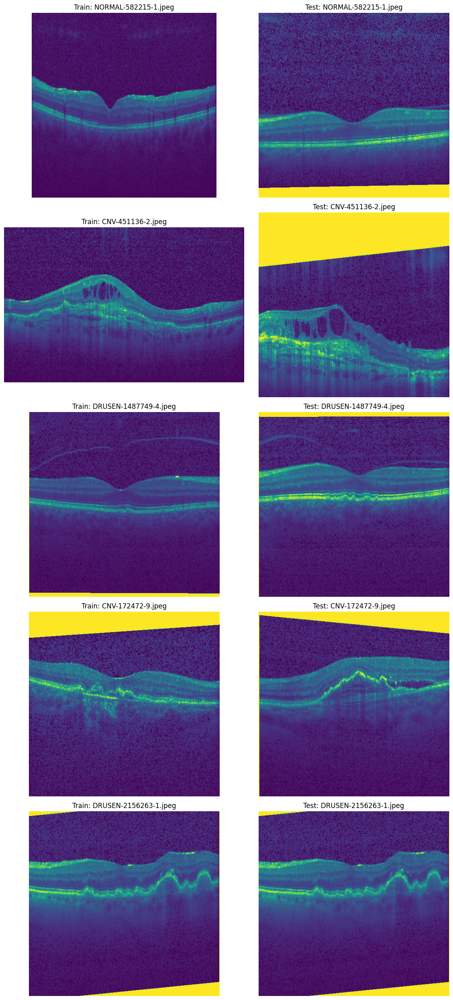

In [14]:
def get_all_files_by_name(folder, target_names):
    found = {}
    for root, _, files in os.walk(folder):
        for file in files:
            if file in target_names:
                found[file] = os.path.join(root, file)
    return found

# Дубликаты между train и test
duplicates_train_test = train_files & test_files
print(f"Найдено дубликатов между train и test: {len(duplicates_train_test)}")

# Получаем полные пути
train_duplicates = get_all_files_by_name(train_dir, duplicates_train_test)
test_duplicates = get_all_files_by_name(test_dir, duplicates_train_test)

# Сколько примеров показать
num_examples = 5
examples = list(duplicates_train_test)[:num_examples]

# Отображение
plt.figure(figsize=(12, 5 * num_examples))
for idx, fname in enumerate(examples):
    train_path = train_duplicates.get(fname)
    test_path = test_duplicates.get(fname)

    if not train_path or not test_path:
        continue

    # Train image
    plt.subplot(num_examples, 2, 2 * idx + 1)
    plt.imshow(Image.open(train_path))
    plt.title(f"Train: {fname}")
    plt.axis('off')

    # Test image
    plt.subplot(num_examples, 2, 2 * idx + 2)
    plt.imshow(Image.open(test_path))
    plt.title(f"Test: {fname}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [16]:
def compare_images(img1_path, img2_path):
    img1 = np.array(Image.open(img1_path).convert("L")).astype(np.float32)
    img2 = np.array(Image.open(img2_path).convert("L")).astype(np.float32)
    img1 = img1 / 255.0
    img2 = img2 / 255.0

    # Приводим к одному размеру 
    if img1.shape != img2.shape:
        return np.inf

    mae = np.mean(np.abs(img1 - img2))
    return mae

for fname in examples:
    train_path = train_duplicates.get(fname)
    test_path = test_duplicates.get(fname)
    if train_path and test_path:
        mae = compare_images(train_path, test_path)
        print(f"{fname} — MAE (средняя разница): {mae:.4f}")

NORMAL-582215-1.jpeg — MAE (средняя разница): inf
CNV-451136-2.jpeg — MAE (средняя разница): inf
DRUSEN-1487749-4.jpeg — MAE (средняя разница): 0.1212
CNV-172472-9.jpeg — MAE (средняя разница): 0.1297
DRUSEN-2156263-1.jpeg — MAE (средняя разница): 0.0000


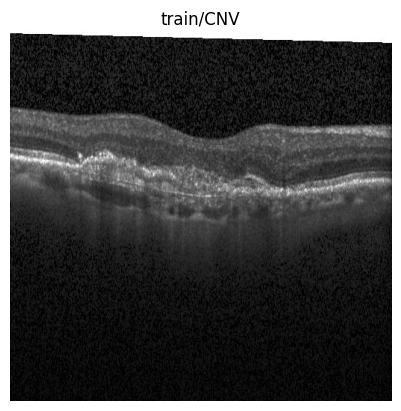

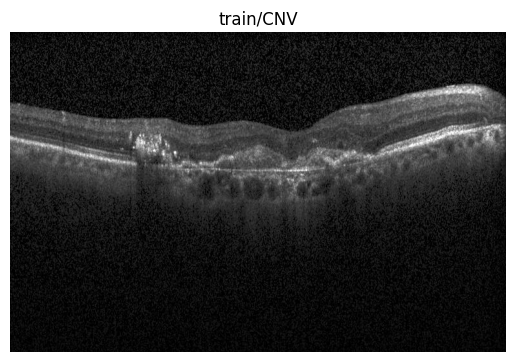

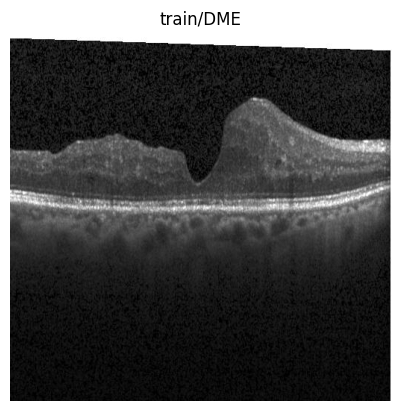

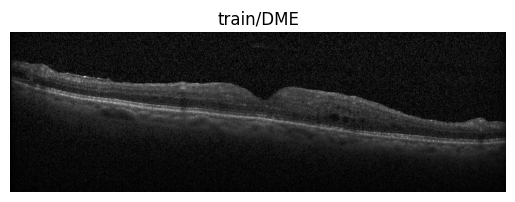

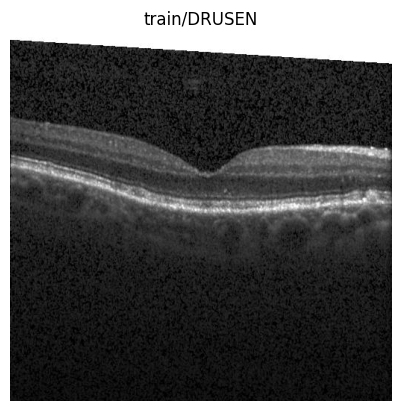

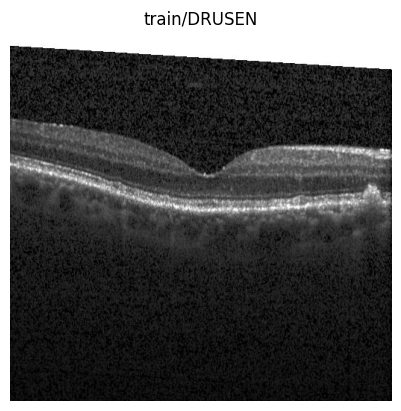

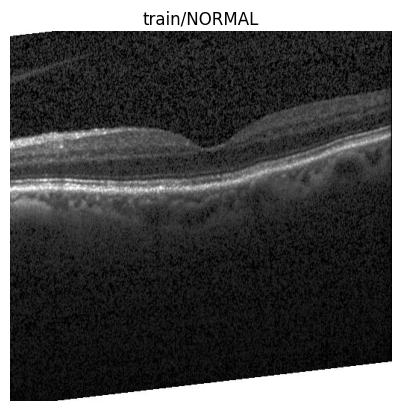

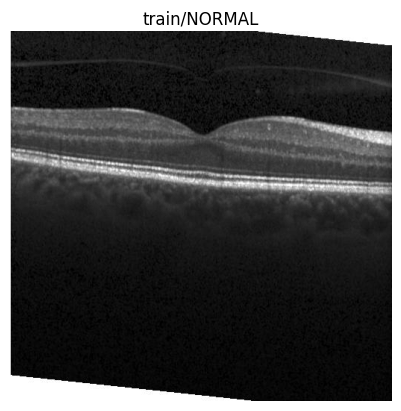

In [18]:
samples_per_class = 2
split = 'train'

for cls in os.listdir(os.path.join(data_root, split)):
    cls_path = os.path.join(data_root, split, cls)
    files = os.listdir(cls_path)[:samples_per_class]
    
    for f in files:
        img = Image.open(os.path.join(cls_path, f))
        plt.imshow(img, cmap='gray')
        plt.title(f"{split}/{cls}")
        plt.axis('off')
        plt.show()

### И у нас проблема дубликатов

### Убираем дубликаты

In [25]:
def extract_patient_id(filename):
    match = re.match(r"[A-Z]+-(\d+)-\d+\.jpe?g", filename)
    return match.group(1) if match else None

In [27]:
def build_patient_map(root_dir):
    patient_map = defaultdict(list)
    for root, _, files in os.walk(root_dir):
        for f in files:
            if f.lower().endswith((".jpg", ".jpeg")):
                pid = extract_patient_id(f)
                if pid:
                    full_path = os.path.join(root, f)
                    patient_map[pid].append(full_path)
    return patient_map

In [29]:
def split_patient_ids(patient_ids, train_size=0.7, val_size=0.15, test_size=0.15, seed=42):
    assert abs(train_size + val_size + test_size - 1.0) < 1e-6
    train_ids, temp_ids = train_test_split(patient_ids, train_size=train_size, random_state=seed)
    val_ids, test_ids = train_test_split(temp_ids, train_size=val_size / (val_size + test_size), random_state=seed)
    return train_ids, val_ids, test_ids

In [31]:
def copy_files(patient_map, train_ids, val_ids, test_ids, out_dir="clean_OCT"):
    for subset_name, subset_ids in zip(["train", "val", "test"], [train_ids, val_ids, test_ids]):
        for pid in subset_ids:
            for file_path in patient_map[pid]:
                class_name = os.path.basename(os.path.dirname(file_path))  # CNV, DME и т.д.
                dest_dir = os.path.join(out_dir, subset_name, class_name)
                os.makedirs(dest_dir, exist_ok=True)
                shutil.copy2(file_path, dest_dir)

In [33]:
source_dir = r"C:\Users\555\Desktop\BioML\CV\practice\OCT2017"

In [35]:
patient_map = build_patient_map(source_dir)
print(f"Найдено пациентов: {len(patient_map)}")

Найдено пациентов: 4657


In [37]:
all_patient_ids = list(patient_map.keys())
train_ids, val_ids, test_ids = split_patient_ids(all_patient_ids)
print(f"Train: {len(train_ids)}, Val: {len(val_ids)}, Test: {len(test_ids)}")

Train: 3259, Val: 699, Test: 699


In [39]:
copy_files(patient_map, train_ids, val_ids, test_ids, out_dir="C:\\Users\\555\\Desktop\\BioML\\CV\\clean_OCT")

In [41]:
print(f"Всего уникальных пациентов: {len(patient_map)}")

# Примерно сколько снимков на каждого:
lengths = [len(paths) for paths in patient_map.values()]
print(f"Среднее: {np.mean(lengths):.2f}, медиана: {np.median(lengths):.2f}")

Всего уникальных пациентов: 4657
Среднее: 18.14, медиана: 6.00


In [43]:
train_total = sum(len(patient_map[pid]) for pid in train_ids)
val_total = sum(len(patient_map[pid]) for pid in val_ids)
test_total = sum(len(patient_map[pid]) for pid in test_ids)

print(f"Train: {train_total} файлов")
print(f"Val: {val_total} файлов")
print(f"Test: {test_total} файлов")

Train: 58098 файлов
Val: 13480 файлов
Test: 12906 файлов


In [3]:
data_root = r"C:\Users\555\Desktop\BioML\CV\clean_OCT"

In [5]:
split_counts = defaultdict(lambda: defaultdict(int))

for split in ['train', 'val', 'test']:
    split_path = os.path.join(data_root, split)
    if not os.path.exists(split_path):
        continue

    for cls in os.listdir(split_path):
        cls_path = os.path.join(split_path, cls)
        if not os.path.isdir(cls_path):
            continue

        # Считаем только .jpg/.jpeg файлы
        count = len([
            f for f in os.listdir(cls_path)
            if f.lower().endswith((".jpg", ".jpeg"))
        ])
        split_counts[split][cls] = count

# Вывод
for split, class_counts in split_counts.items():
    print(f"\n{split.upper()}:")
    for cls, count in sorted(class_counts.items()):
        print(f"{cls:8s}: {count}")


TRAIN:
CNV     : 24463
DME     : 8487
DRUSEN  : 5788
NORMAL  : 18731

VAL:
CNV     : 6625
DME     : 1270
DRUSEN  : 1580
NORMAL  : 3865

TEST:
CNV     : 6128
DME     : 1665
DRUSEN  : 1252
NORMAL  : 3751


### Просмотр данных

In [7]:
shapes = []

for split in ['train', 'val', 'test']:
    for cls in os.listdir(os.path.join(data_root, split)):
        path = os.path.join(data_root, split, cls)
        for fname in os.listdir(path)[:100]:
            img = Image.open(os.path.join(path, fname))
            shapes.append(img.size)

# Частые размеры
Counter(shapes).most_common(5)

[((512, 496), 540),
 ((512, 512), 284),
 ((768, 496), 265),
 ((1536, 496), 107),
 ((1024, 496), 4)]

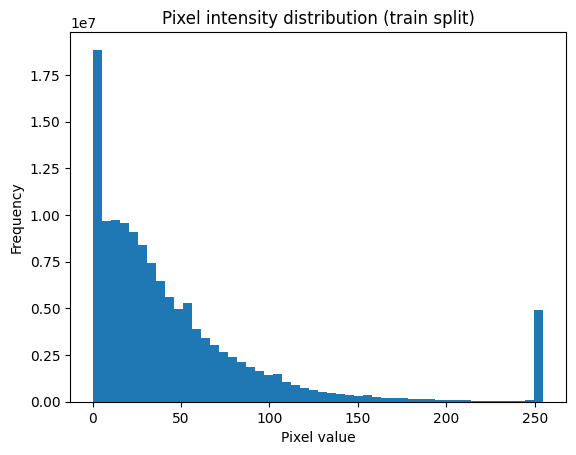

In [51]:
pixels = []

for split in ['train']:
    for cls in os.listdir(os.path.join(data_root, split)):
        path = os.path.join(data_root, split, cls)
        for fname in os.listdir(path)[:100]:
            img = Image.open(os.path.join(path, fname)).convert('L')  # grayscale
            pixels.extend(np.array(img).flatten())

plt.hist(pixels, bins=50)
plt.title("Pixel intensity distribution (train split)")
plt.xlabel("Pixel value")
plt.ylabel("Frequency")
plt.show()

In [9]:
folder = r"C:\Users\555\Desktop\BioML\CV\clean_OCT\train\NORMAL"

image_paths = sorted(os.listdir(folder))

def show_image(idx):
    img_path = os.path.join(folder, image_paths[idx])
    img = Image.open(img_path)
    plt.imshow(img, cmap='gray')
    plt.title(f"NORMAL — {idx}")
    plt.axis('off')
    plt.show()

interact(show_image, idx=widgets.IntSlider(value=0, min=0, max=len(image_paths)-1));

interactive(children=(IntSlider(value=0, description='idx', max=18730), Output()), _dom_classes=('widget-inter…

## трансформ-блок для train и val/test

In [11]:
class AlbumentationsTransform:
    def __init__(self, albumentations_transform):
        self.albumentations_transform = albumentations_transform

    def __call__(self, img):
        img = np.array(img.convert("RGB"))  # из PIL в numpy RGB
        augmented = self.albumentations_transform(image=img)
        return augmented["image"]

In [13]:
train_transform = AlbumentationsTransform(A.Compose([
    A.Resize(224, 224),
    A.CLAHE(p=0.3),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.3),
    A.GaussianBlur(p=0.2),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=5, p=0.3),
    A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ToTensorV2()
]))

val_transform = AlbumentationsTransform(A.Compose([
    A.Resize(224, 224),
    A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ToTensorV2()
]))

D:\Anaconda\envs\opencv_env\lib\site-packages\albumentations\core\validation.py:87: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


## Обёртка BinaryOCTDataset с обработкой grayscale

In [15]:
binary_label_map = {'CNV': 1, 'DME': 1, 'DRUSEN': 1, 'NORMAL': 0}

class_map = None

class BinaryOCTDataset(ImageFolder):
    def __init__(self, root, transform=None):
        super().__init__(root)  
        global class_map
        class_map = {v: k for k, v in self.class_to_idx.items()}
        self.custom_transform = transform  

    def __getitem__(self, index):
        path, label = self.samples[index]
        image = self.loader(path) 
        class_name = class_map[label]
        binary_label = binary_label_map[class_name]

        if self.custom_transform:
            image = self.custom_transform(image) 

        return image, binary_label

In [17]:
train_dataset = BinaryOCTDataset(os.path.join(data_root, "train"), transform=train_transform)
val_dataset   = BinaryOCTDataset(os.path.join(data_root, "val"),   transform=val_transform)
test_dataset  = BinaryOCTDataset(os.path.join(data_root, "test"),  transform=val_transform)

## Визуализация аугментаций

In [66]:
def visualize_augmentations(albumentations_transform, dataset, num_samples=3):
    fig, axes = plt.subplots(num_samples, 5, figsize=(20, 4 * num_samples))

    for i in range(num_samples):
        path, _ = dataset.samples[i]
        img = Image.open(path).convert("RGB")  # PIL.Image
        img_np = np.array(img)  # Преобразуем в numpy

        # Оригинальное изображение после базового трансформера
        augmented = albumentations_transform(img)  # <- Передаём PIL.Image
        orig_img = augmented.permute(1, 2, 0).cpu().numpy()
        orig_img = (orig_img * 0.5) + 0.5  # разнормировка
        orig_img = np.clip(orig_img, 0, 1)

        axes[i, 0].imshow(orig_img)
        axes[i, 0].set_title("Original")
        axes[i, 0].axis('off')

        # Аугментации
        for j in range(1, 5):
            aug_img = albumentations_transform(img)
            aug_img = aug_img.permute(1, 2, 0).cpu().numpy()
            aug_img = (aug_img * 0.5) + 0.5
            aug_img = np.clip(aug_img, 0, 1)

            axes[i, j].imshow(aug_img)
            axes[i, j].set_title(f"Augmented {j}")
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

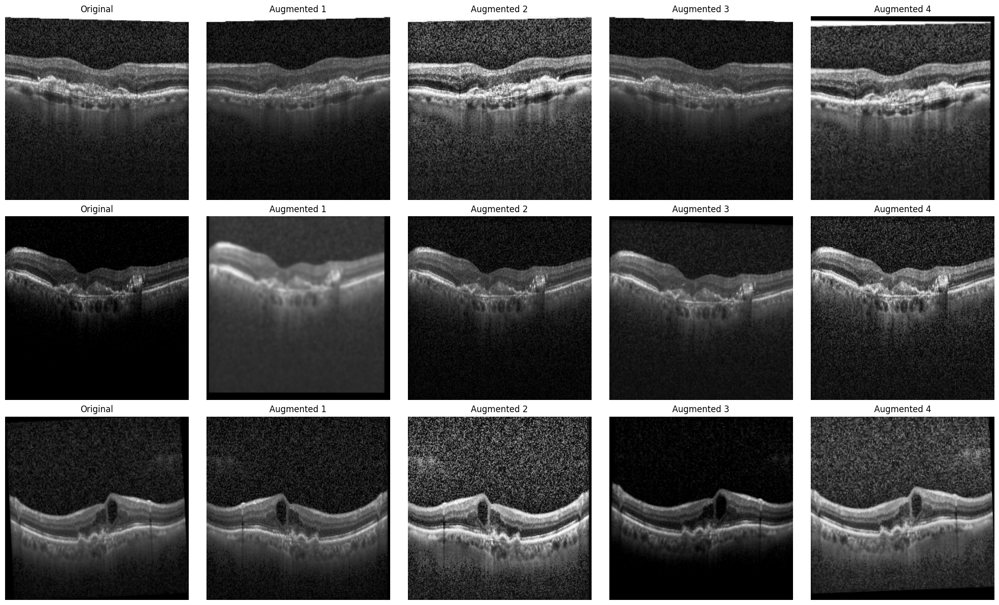

In [68]:
visualize_augmentations(train_transform, train_dataset, num_samples=3)

### Функции для обучения и визуализации

In [70]:
# EarlyStopping

class EarlyStopping:
    def __init__(self, patience=3, min_delta=0.001, path='best_model.pt'):
        self.patience = patience
        self.min_delta = min_delta
        self.best_loss = float('inf')
        self.counter = 0
        self.path = path

    def step(self, val_loss, model):
        if val_loss < self.best_loss - self.min_delta:
            self.best_loss = val_loss
            self.counter = 0
            torch.save(model.state_dict(), self.path)
            return False  # don't stop
        else:
            self.counter += 1
            if self.counter >= self.patience:
                return True  # stop training
            return False

In [72]:
# Метрики и логгирование

def compute_metrics(preds, labels, threshold=0.5):
    bin_preds = (preds.numpy() > threshold).astype(int)
    true = labels.numpy().astype(int)

    return {
        "accuracy": accuracy_score(true, bin_preds),
        "precision": precision_score(true, bin_preds),
        "recall": recall_score(true, bin_preds),
        "f1": f1_score(true, bin_preds),
        "roc_auc": roc_auc_score(true, preds.numpy())
    }

In [74]:
# Визуализация истории
def plot_metrics(history):
    epochs = len(history['train_loss'])

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(epochs), history['train_loss'], label='Train Loss')
    plt.plot(range(epochs), history['val_loss'], label='Val Loss')
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss over epochs")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(range(epochs), history['val_f1'], label='F1')
    plt.plot(range(epochs), history['val_auc'], label='ROC AUC')
    plt.xlabel("Epoch")
    plt.ylabel("Score")
    plt.title("Validation metrics")
    plt.legend()

    plt.tight_layout()
    plt.show()

In [76]:
# CSV-дозапись

def append_metrics_to_csv(new_results: pd.DataFrame, csv_path: str):
    if new_results.empty:
        print("[LOG] Новых строк нет — DataFrame пуст.")
        return

    try:
        existing = pd.read_csv(csv_path)
        updated = pd.concat([existing, new_results], ignore_index=True)
    except FileNotFoundError:
        updated = new_results

    updated.to_csv(csv_path, index=False)
    print(f"[LOG] Сохранено {len(new_results)} новых строк. Всего строк в файле: {len(updated)}")

In [78]:
# MLflow логгирование

def log_to_mlflow(metrics, params, model=None, artifact_paths=None):
    mlflow.start_run()
    for k, v in metrics.items():
        mlflow.log_metric(k, v)
    for k, v in params.items():
        mlflow.log_param(k, v)
    if model is not None:
        mlflow.pytorch.log_model(model, "model")
    if artifact_paths:
        for path in artifact_paths:
            mlflow.log_artifact(path)
    mlflow.end_run()

In [80]:
# Визуализация поверхности лосса

def plot_loss_surface_2d(model, dataloader, criterion, device, layer_name='fc', steps=20, scale=1.0):
    weights = getattr(model, layer_name).weight.data.clone()
    direction1 = torch.randn_like(weights)
    direction2 = torch.randn_like(weights)

    x_vals = np.linspace(-scale, scale, steps)
    y_vals = np.linspace(-scale, scale, steps)
    loss_surface = np.zeros((steps, steps))

    for i, dx in enumerate(x_vals):
        for j, dy in enumerate(y_vals):
            getattr(model, layer_name).weight.data = weights + dx * direction1 + dy * direction2
            total_loss = 0
            for inputs, labels in dataloader:
                inputs, labels = inputs.to(device), labels.float().unsqueeze(1).to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                total_loss += loss.item()
            loss_surface[j, i] = total_loss / len(dataloader)

    # Restore original weights
    getattr(model, layer_name).weight.data = weights

    plt.figure(figsize=(6,5))
    plt.contourf(x_vals, y_vals, loss_surface, levels=50, cmap='viridis')
    plt.colorbar()
    plt.title("Loss surface (2D slice)")
    plt.xlabel("Direction 1")
    plt.ylabel("Direction 2")
    plt.show()

# Подготовка модели и обучения

## DataLoader

In [19]:
train_loader = DataLoader(
    train_dataset,
    batch_size=64,
    shuffle=True,
    num_workers=0,
    pin_memory=False
)

val_loader = DataLoader(
    val_dataset,
    batch_size=64,
    shuffle=False,
    num_workers=0,
    pin_memory=False
)

test_loader = DataLoader(
    test_dataset,
    batch_size=64,
    shuffle=False,
    num_workers=0,
    pin_memory=False
)

## Модель: ResNet50 (предобученная)

In [84]:
model = resnet50(weights=ResNet50_Weights.DEFAULT)
model.fc = nn.Linear(model.fc.in_features, 1)

## Loss, Optimizer, Scheduler

In [86]:
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=2, factor=0.5)

In [88]:
csv_path = r'C:\Users\555\Desktop\BioML\CV\practice\metrics.csv'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [90]:
# История метрик
history = {
    'train_loss': [],
    'val_loss': [],
    'val_f1': [],
    'val_auc': []
}

## Train / Eval функции

In [92]:
# ТРЕНИРОВКА ОДНОЙ ЭПОХИ 
def train_one_epoch(model, dataloader, optimizer, criterion, device):
    model.train()
    epoch_loss = 0
    all_preds, all_labels = [], []

    for images, labels in tqdm(dataloader, desc="Train", leave=False):
        images, labels = images.to(device), labels.float().unsqueeze(1).to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()
        all_preds.append(torch.sigmoid(outputs).detach().cpu())
        all_labels.append(labels.cpu())

    return epoch_loss / len(dataloader), torch.cat(all_preds), torch.cat(all_labels)


# ВАЛИДАЦИЯ 
def evaluate(model, dataloader, criterion, device):
    model.eval()
    epoch_loss = 0
    all_preds, all_labels = [], []

    with torch.no_grad():
        for images, labels in tqdm(dataloader, desc="Validation", leave=False):
            images, labels = images.to(device), labels.float().unsqueeze(1).to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            epoch_loss += loss.item()
            all_preds.append(torch.sigmoid(outputs).cpu())
            all_labels.append(labels.cpu())

    return epoch_loss / len(dataloader), torch.cat(all_preds), torch.cat(all_labels)

## Основной цикл обучения

In [94]:
num_epochs = 10
best_model_path = r'C:\Users\555\Desktop\BioML\CV\practice\best_model_resnet50.pt'

In [96]:
early_stopper = EarlyStopping(patience=3, min_delta=0.001, path=best_model_path)

print("=" * 30 + "\nНачало обучения модели\n" + "=" * 30)

for epoch in range(1, num_epochs + 1):
    train_loss, train_preds, train_labels = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_preds, val_labels = evaluate(model, val_loader, criterion, device)

    train_metrics = compute_metrics(train_preds, train_labels)
    val_metrics = compute_metrics(val_preds, val_labels)

    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['val_f1'].append(val_metrics['f1'])
    history['val_auc'].append(val_metrics['roc_auc'])

    print(f"\n[Эпоха {epoch}/{num_epochs}]")
    print(f"Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
          f"F1: {val_metrics['f1']:.4f}, ROC AUC: {val_metrics['roc_auc']:.4f}")

    scheduler.step(val_loss)

    # Early stopping с сохранением лучшей модели
    if early_stopper.step(val_loss, model):
        print(f"Early stopping triggered on epoch {epoch}")
        break

print("=" * 30 + "\nОбучение завершено\n" + "=" * 30)

# Загрузка лучшей модели
model.load_state_dict(torch.load(best_model_path))

Начало обучения модели


Train:   0%|          | 0/898 [00:00<?, ?it/s]

Validation:   0%|          | 0/209 [00:00<?, ?it/s]


[Эпоха 1/10]
Train Loss: 0.0876, Val Loss: 0.0342, F1: 0.9927, ROC AUC: 0.9991


Train:   0%|          | 0/898 [00:00<?, ?it/s]

Validation:   0%|          | 0/209 [00:00<?, ?it/s]


[Эпоха 2/10]
Train Loss: 0.0520, Val Loss: 0.0265, F1: 0.9936, ROC AUC: 0.9993


Train:   0%|          | 0/898 [00:00<?, ?it/s]

Validation:   0%|          | 0/209 [00:00<?, ?it/s]


[Эпоха 3/10]
Train Loss: 0.0450, Val Loss: 0.0359, F1: 0.9916, ROC AUC: 0.9991


Train:   0%|          | 0/898 [00:00<?, ?it/s]

Validation:   0%|          | 0/209 [00:00<?, ?it/s]


[Эпоха 4/10]
Train Loss: 0.0423, Val Loss: 0.0262, F1: 0.9939, ROC AUC: 0.9994


Train:   0%|          | 0/898 [00:00<?, ?it/s]

Validation:   0%|          | 0/209 [00:00<?, ?it/s]


[Эпоха 5/10]
Train Loss: 0.0373, Val Loss: 0.0283, F1: 0.9934, ROC AUC: 0.9992
Early stopping triggered on epoch 5
Обучение завершено


C:\Users\555\AppData\Local\Temp\ipykernel_16152\4157826847.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_model_path))


<All keys matched successfully>

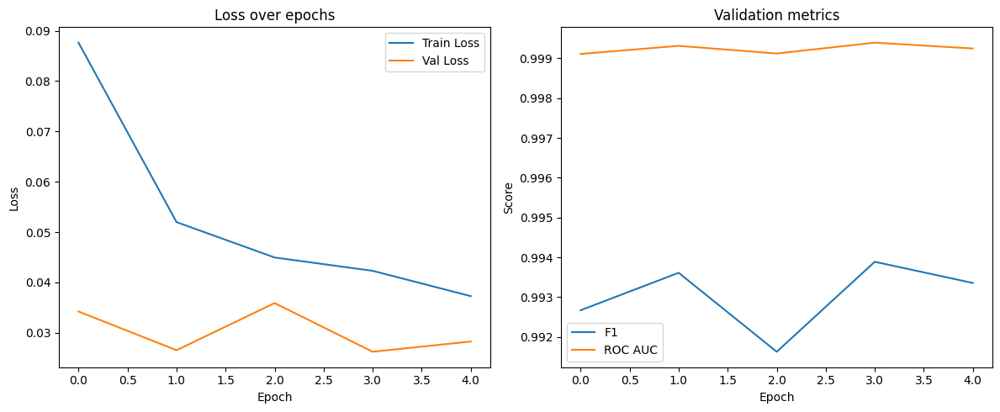

Validation:   0%|          | 0/200 [00:00<?, ?it/s]


Test metrics:
accuracy: 0.9831
precision: 0.9921
recall: 0.9840
f1: 0.9880
roc_auc: 0.9974


In [98]:
# Финальная оценка
plot_metrics(history)
test_loss, test_preds, test_labels = evaluate(model, test_loader, criterion, device)
test_metrics = compute_metrics(test_preds, test_labels)

print("\nTest metrics:")
for k, v in test_metrics.items():
    print(f"{k}: {v:.4f}")

In [100]:
# Сохранение в CSV
df_metrics = pd.DataFrame([{**test_metrics, 'model': 'resnet50'}])
append_metrics_to_csv(df_metrics, csv_path)

[LOG] Сохранено 1 новых строк. Всего строк в файле: 1


In [27]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Архитектура и последний слой (1 нейрон для BCEWithLogitsLoss)
model = models.resnet50(pretrained=False)
model.fc = nn.Linear(model.fc.in_features, 1)  # бинарная классификация

# Загрузка весов
model.load_state_dict(torch.load(r"C:\Users\555\Desktop\BioML\CV\practice\best_model_resnet50.pt", map_location=device))
model = model.to(device)
model.eval()

print("Модель успешно загружена и готова к визуализации поверхности лосса.")

D:\Anaconda\envs\opencv_env\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
D:\Anaconda\envs\opencv_env\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
C:\Users\555\AppData\Local\Temp\ipykernel_12384\2185556330.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be fl

✅ Модель успешно загружена и готова к визуализации поверхности лосса.


In [105]:
small_val_loader = torch.utils.data.DataLoader(
    torch.utils.data.Subset(val_dataset, range(100)),  # 100 картинок
    batch_size=32,
    shuffle=False
)

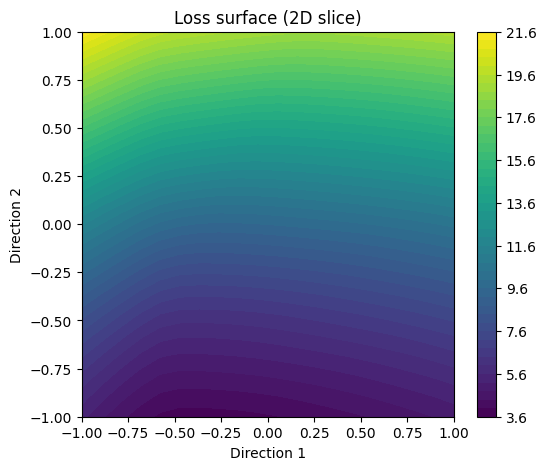

In [109]:
# Визуализация поверхности лосса
plot_loss_surface_2d(model, small_val_loader, criterion, device, layer_name='fc', steps=20)

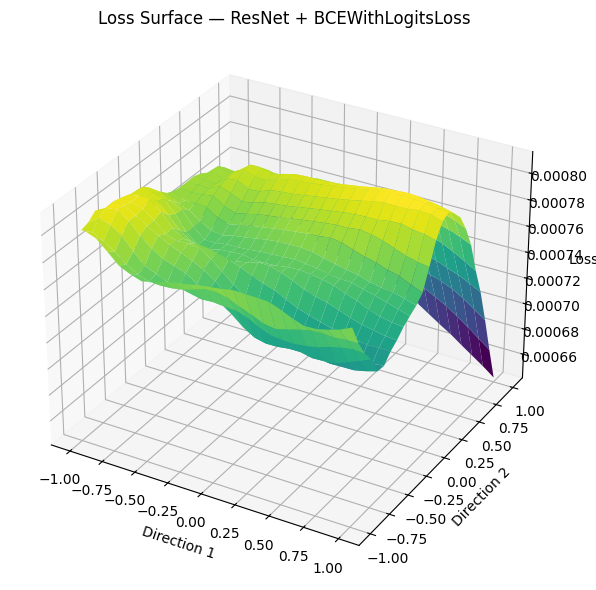

In [29]:
def get_random_directions(model):
    params_vector = torch.nn.utils.parameters_to_vector(model.parameters())
    direction1 = torch.randn_like(params_vector)
    direction2 = torch.randn_like(params_vector)
    direction1 /= torch.norm(direction1)
    direction2 /= torch.norm(direction2)
    return direction1, direction2


def perturb_model(model, base_state_dict, direction1, direction2, alpha, beta):
    model.load_state_dict(copy.deepcopy(base_state_dict))
    base_vector = torch.nn.utils.parameters_to_vector(model.parameters()).detach()
    new_vector = base_vector + alpha * direction1 + beta * direction2
    torch.nn.utils.vector_to_parameters(new_vector, model.parameters())


# Устройство и модель
model.eval()
base_state_dict = copy.deepcopy(model.state_dict())
dir1, dir2 = get_random_directions(model)

# Один батч из валидационного лоадера
batch = next(iter(val_loader))
X_tensor, y_tensor = batch
X_tensor = X_tensor.to(device)
y_tensor = y_tensor.to(device).float()  # для BCEWithLogitsLoss

# Критерий
criterion = nn.BCEWithLogitsLoss()

# Сетка значений
grid_size = 25
alphas = np.linspace(-1, 1, grid_size)
betas = np.linspace(-1, 1, grid_size)
loss_surface = []

# Цикл по поверхности
for alpha in alphas:
    row = []
    for beta in betas:
        perturb_model(model, base_state_dict, dir1, dir2, alpha, beta)
        with torch.inference_mode():
            outputs = model(X_tensor).squeeze(1)  # [B] после squeeze
            loss = criterion(outputs, y_tensor).item()
        row.append(loss)
    loss_surface.append(row)

# Визуализация
A, B = np.meshgrid(alphas, betas)
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(A, B, np.array(loss_surface), cmap='viridis')
ax.set_title("Loss Surface — ResNet + BCEWithLogitsLoss")
ax.set_xlabel('Direction 1')
ax.set_ylabel('Direction 2')
ax.set_zlabel('Loss')
plt.tight_layout()
plt.show()

In [113]:
# Логирование в MLflow
log_to_mlflow(test_metrics, {'epochs': num_epochs, 'lr': 1e-4, 'weight_decay': 1e-4}, model=model, artifact_paths=[csv_path])

2025/06/01 17:51:20 WARNING mlflow.utils.requirements_utils: Found torch version (2.5.1+cu121) contains a local version label (+cu121). MLflow logged a pip requirement for this package as 'torch==2.5.1' without the local version label to make it installable from PyPI. To specify pip requirements containing local version labels, please use `conda_env` or `pip_requirements`.
2025/06/01 17:52:19 WARNING mlflow.utils.requirements_utils: Found torchvision version (0.20.1+cu121) contains a local version label (+cu121). MLflow logged a pip requirement for this package as 'torchvision==0.20.1' without the local version label to make it installable from PyPI. To specify pip requirements containing local version labels, please use `conda_env` or `pip_requirements`.
2025/06/01 17:52:20 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


### GradCAM

In [41]:
class WrappedModelForGradCAM(nn.Module):
    """
    Обёртка для бинарной модели, превращающая выход [B, 1] в [B, 2] (logit, -logit),
    чтобы Grad-CAM можно было использовать с ClassifierOutputTarget(0/1)
    """
    def __init__(self, base_model):
        super().__init__()
        self.base_model = base_model

    def forward(self, x):
        logits = self.base_model(x)  # [B, 1]
        return torch.cat([logits, -logits], dim=1)  # [B, 2]

In [43]:
def show_gradcam_for_samples(model, dataset, class_names=["Normal", "Diseased"], num_samples=5):
    """
    Визуализация Grad-CAM по нескольким примерам для бинарной классификации
    """
    wrapped_model = WrappedModelForGradCAM(model)
    wrapped_model.eval()
    device = next(model.parameters()).device
    wrapped_model.to(device)

    target_layers = [wrapped_model.base_model.layer4[-1]]  # слой ResNet
    cam = GradCAM(model=wrapped_model, target_layers=target_layers)

    for idx in range(num_samples):
        image_tensor, label = dataset[idx]
        input_tensor = image_tensor.unsqueeze(0).to(device)

        for target_class in [0, 1]:
            target = ClassifierOutputTarget(category=target_class)
            grayscale_cam = cam(input_tensor=input_tensor, targets=[target])[0]

            img_np = image_tensor.permute(1, 2, 0).cpu().numpy()
            img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min() + 1e-8)
            visualization = show_cam_on_image(img_np, grayscale_cam, use_rgb=True)

            plt.figure(figsize=(5, 5))
            plt.imshow(visualization)
            plt.axis("off")
            plt.title(f"Sample {idx+1} — Target: {target_class} ({class_names[target_class]})")
            plt.show()

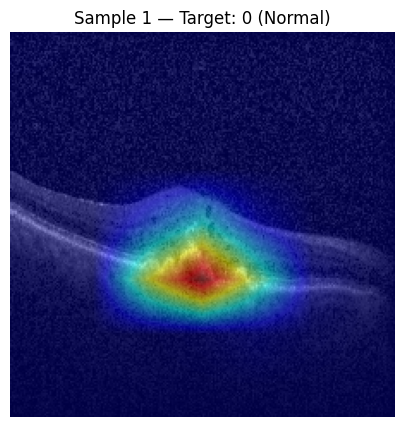

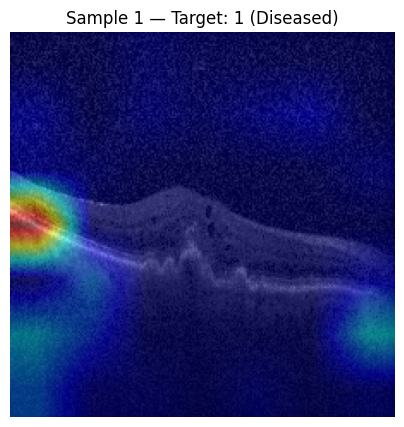

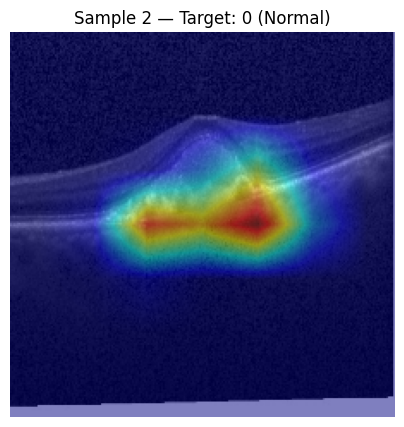

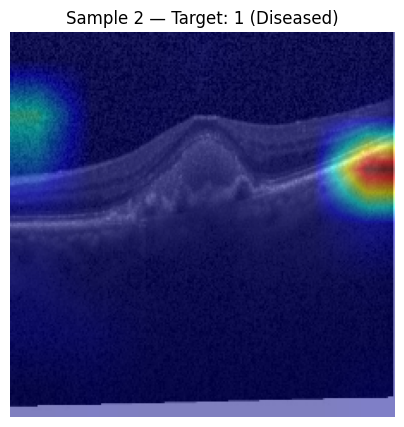

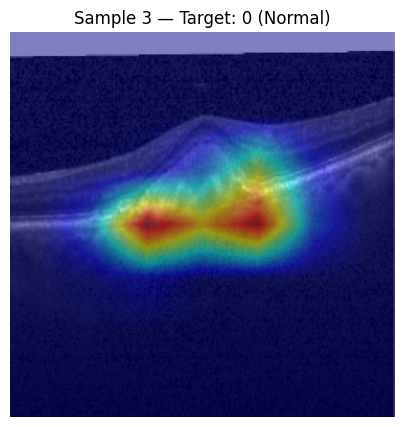

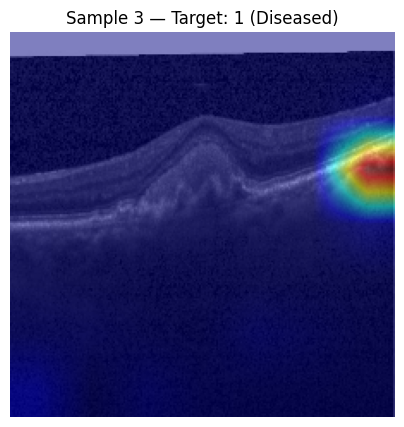

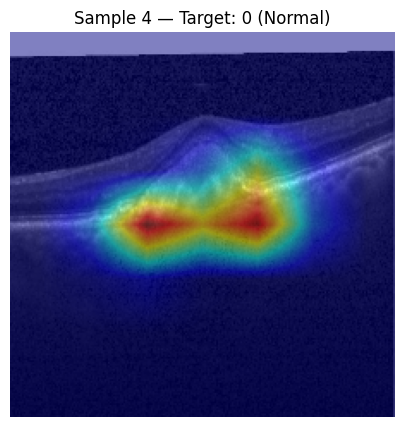

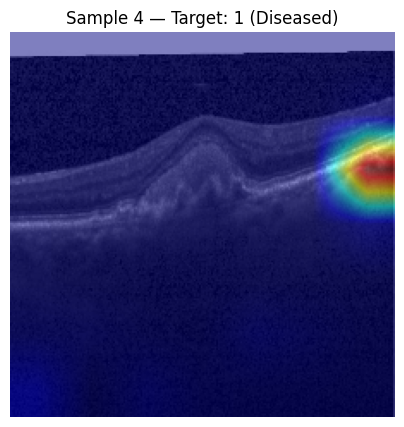

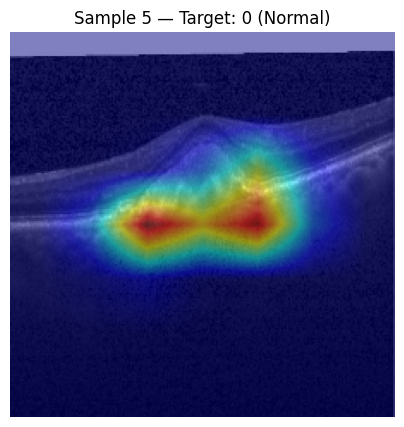

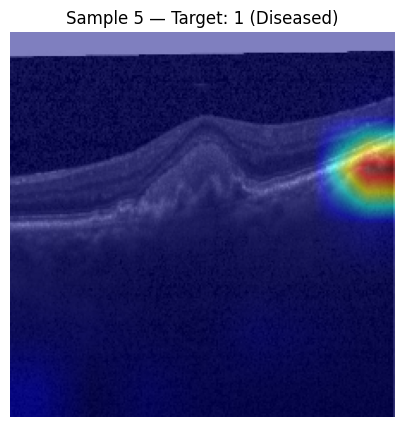

In [45]:
show_gradcam_for_samples(model, val_dataset, class_names=["Normal", "Diseased"], num_samples=5)

In [47]:
def show_gradcam_with_prediction(model, dataset, class_names=["Normal", "Diseased"], num_samples=5):
    """
    Показывает Grad-CAM + предсказание модели + истинную метку
    """
    model.eval()
    device = next(model.parameters()).device
    target_layers = [model.layer4[-1]]  # для ResNet
    cam = GradCAM(model=model, target_layers=target_layers)

    for idx in random.sample(range(len(dataset)), num_samples):
        image_tensor, true_label = dataset[idx]
        input_tensor = image_tensor.unsqueeze(0).to(device)

        # Получаем логит и предсказание
        with torch.no_grad():
            logit = model(input_tensor)
            prob = torch.sigmoid(logit).item()
            pred_label = 1 if prob >= 0.5 else 0

        # GradCAM ожидает, что логит будет в виде вектора — имитируем
        class BinaryTarget:
            def __init__(self, class_idx):
                self.class_idx = class_idx
            def __call__(self, model_output):
                return model_output.view(-1)[0] if self.class_idx == 1 else -model_output.view(-1)[0]

        target = BinaryTarget(pred_label)
        grayscale_cam = cam(input_tensor=input_tensor, targets=[target])[0]

        # Обратная нормализация изображения
        img_np = image_tensor.permute(1, 2, 0).cpu().numpy()
        img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min() + 1e-8)
        visualization = show_cam_on_image(img_np, grayscale_cam, use_rgb=True)

        plt.figure(figsize=(6, 6))
        plt.imshow(visualization)
        plt.title(f"True: {class_names[true_label]} | Pred: {class_names[pred_label]} ({prob:.2f})")
        plt.axis("off")
        plt.show()

In [49]:
def show_difference_cam(model, dataset, class_names=["Normal", "Diseased"], num_samples=5):
    """
    Показывает разницу между Grad-CAM для класса 1 и класса 0 (Difference-CAM)
    """
    model.eval()
    device = next(model.parameters()).device
    target_layers = [model.layer4[-1]]
    cam = GradCAM(model=model, target_layers=target_layers)

    class BinaryTarget:
        def __init__(self, class_idx):
            self.class_idx = class_idx
        def __call__(self, model_output):
            return model_output.view(-1)[0] if self.class_idx == 1 else -model_output.view(-1)[0]

    for idx in random.sample(range(len(dataset)), num_samples):
        image_tensor, label = dataset[idx]
        input_tensor = image_tensor.unsqueeze(0).to(device)

        # Grad-CAM для каждого класса
        cam_1 = cam(input_tensor=input_tensor, targets=[BinaryTarget(1)])[0]
        cam_0 = cam(input_tensor=input_tensor, targets=[BinaryTarget(0)])[0]

        # Разница
        diff_cam = cam_1 - cam_0
        diff_cam = np.clip(diff_cam, 0, 1)

        img_np = image_tensor.permute(1, 2, 0).cpu().numpy()
        img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min() + 1e-8)
        visualization = show_cam_on_image(img_np, diff_cam, use_rgb=True)

        plt.figure(figsize=(6, 6))
        plt.imshow(visualization)
        plt.title(f"Difference-CAM | True label: {class_names[label]}")
        plt.axis("off")
        plt.show()

In [51]:
def show_guided_gradcam(model, dataset, class_names=["Normal", "Diseased"], num_samples=5):
    """
    Показывает объединение Guided Backpropagation и Grad-CAM
    """
    model.eval()
    device = next(model.parameters()).device
    target_layers = [model.layer4[-1]]
    
    cam = GradCAM(model=model, target_layers=target_layers)
    gb_model = GuidedBackpropReLUModel(model=model, device=device)  

    class BinaryTarget:
        def __init__(self, class_idx):
            self.class_idx = class_idx
        def __call__(self, model_output):
            return model_output.view(-1)[0] if self.class_idx == 1 else -model_output.view(-1)[0]

    for idx in random.sample(range(len(dataset)), num_samples):
        image_tensor, label = dataset[idx]
        input_tensor = image_tensor.unsqueeze(0).to(device)

        # Получаем логит и предсказание
        with torch.no_grad():
            logit = model(input_tensor)
            prob = torch.sigmoid(logit).item()
            pred_label = 1 if prob >= 0.5 else 0

        # Grad-CAM
        cam_result = cam(input_tensor=input_tensor, targets=[BinaryTarget(pred_label)])[0]

        # Guided Backpropagation
        guided_grads = gb_model(input_tensor)  # возвращает сразу numpy.ndarray

        # Объединение Guided Backprop и Grad-CAM
        cam_expanded = np.expand_dims(cam_result, axis=2)  # shape: (H, W, 1)
        combined = cam_expanded * guided_grads  # shape: (H, W, 3) если всё корректно
        combined = deprocess_image(combined)

        plt.figure(figsize=(6, 6))
        plt.imshow(combined)
        plt.title(f"Guided Grad-CAM | True: {class_names[label]} | Pred: {class_names[pred_label]}")
        plt.axis("off")
        plt.show()

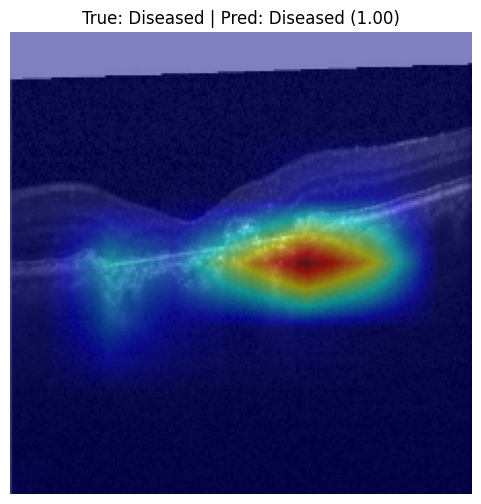

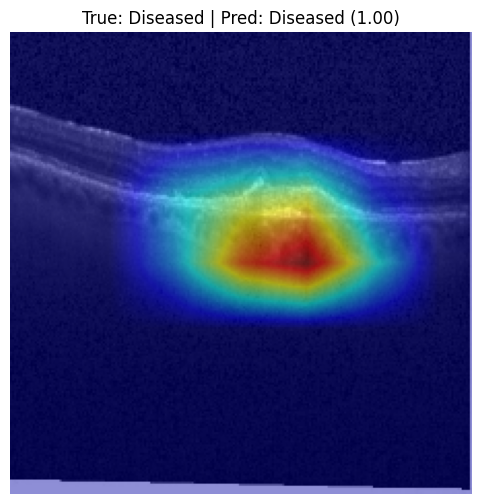

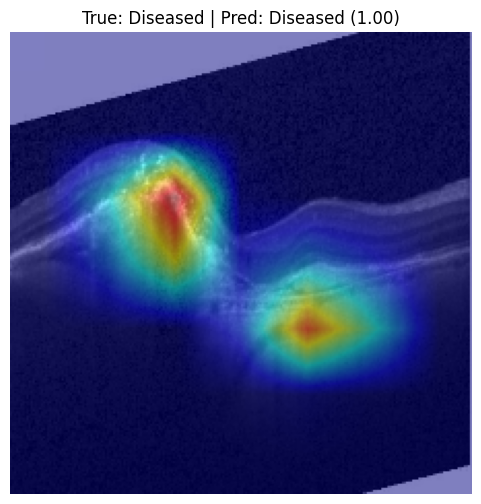

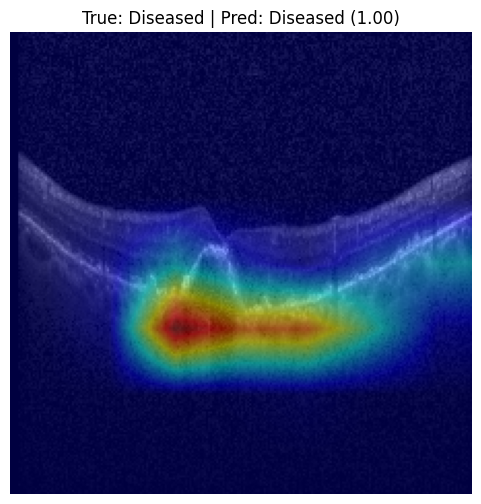

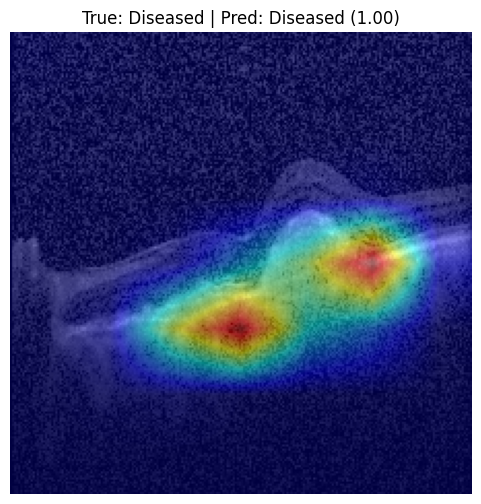

In [53]:
# Покажет 5 случайных изображений из валидационного датасета с Grad-CAM и предсказанием
show_gradcam_with_prediction(
    model=model,
    dataset=test_dataset,  
    class_names=["Normal", "Diseased"],  # Названия классов
    num_samples=5  # Сколько примеров показать
)

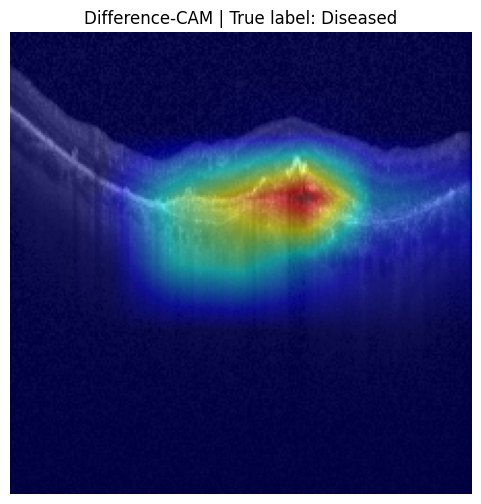

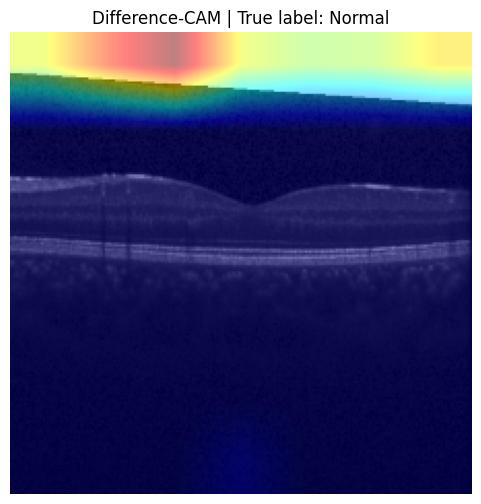

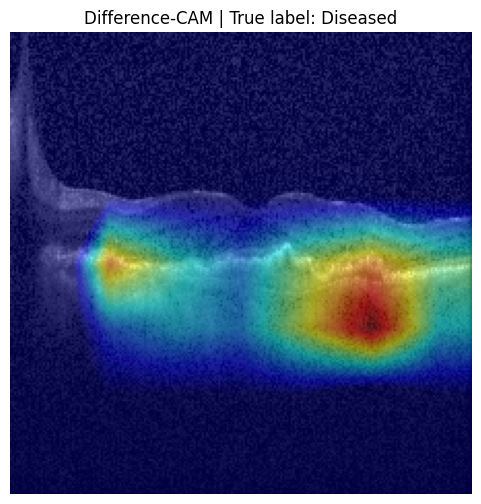

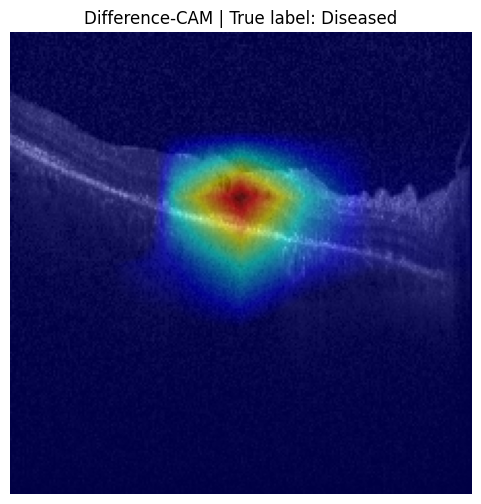

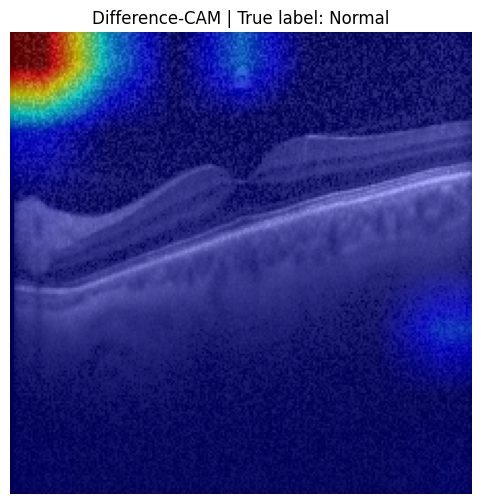

In [55]:
show_difference_cam(
    model=model,  
    dataset=test_dataset,  
    class_names=["Normal", "Diseased"],  
    num_samples=5  
)

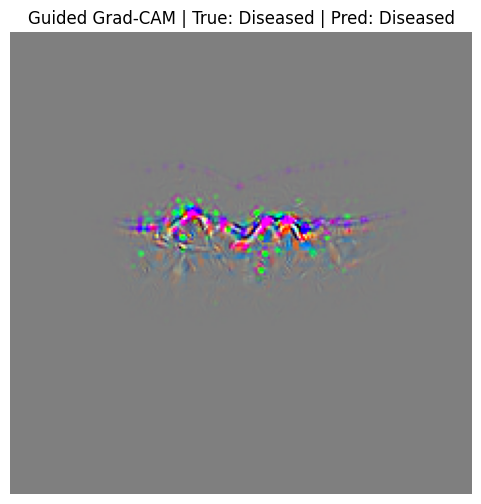

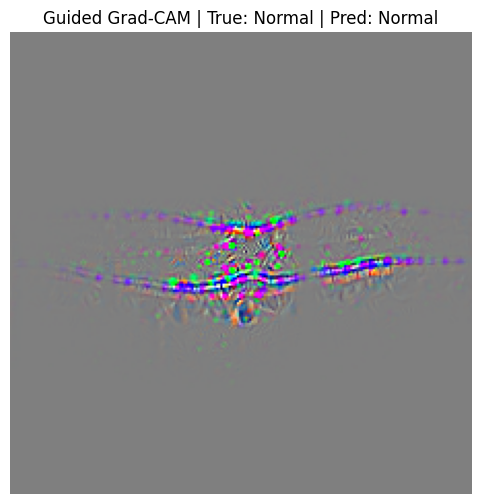

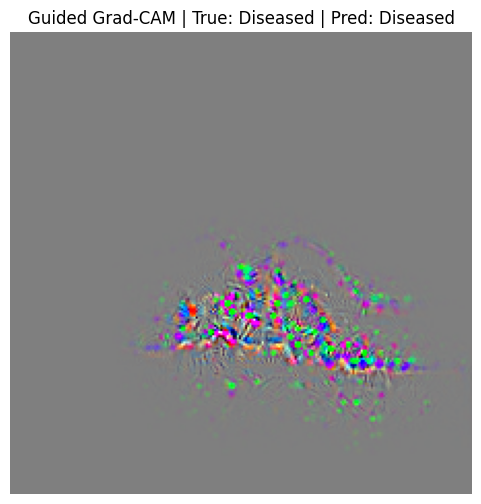

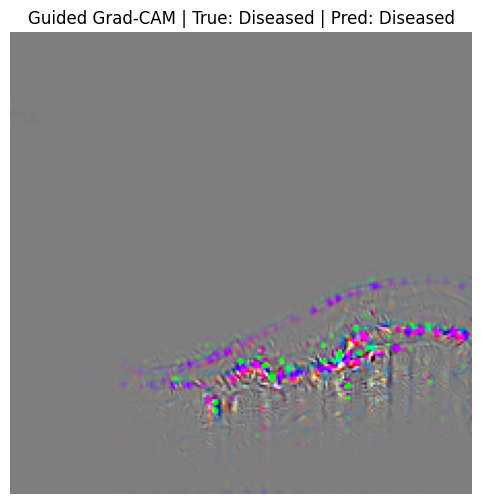

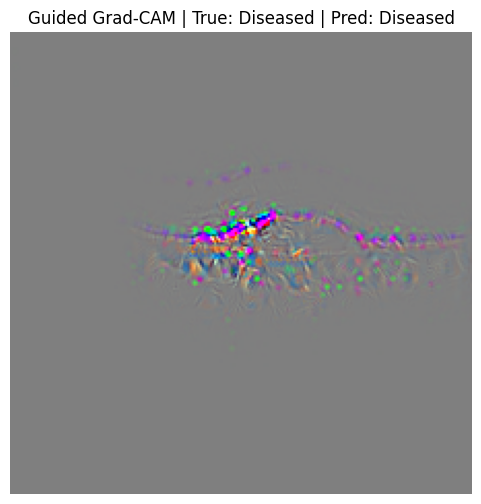

In [57]:
show_guided_gradcam(model, test_dataset, class_names=["Normal", "Diseased"], num_samples=5)

## Обоснование выбранных метрик

Для оценки качества бинарной классификации использованы следующие метрики:

- **Accuracy (точность)** — общий процент правильных предсказаний. Подходит при сбалансированных классах.
- **Precision (точность для положительного класса)** — доля корректных предсказаний "болен" среди всех предсказаний "болен". Важно в клиническом контексте, чтобы избежать ложных тревог.
- **Recall (полнота)** — доля найденных больных среди всех реальных больных. Критически важно в медицине, чтобы не пропустить заболевшего пациента.
- **F1-score** — гармоническое среднее между precision и recall. Особенно актуален при небольшом дисбалансе классов.
- **ROC AUC** — метрика, отражающая способность модели отличать классы при разных порогах. Это стандартная метрика, рекомендованная инициативой MIDRC (Medical Imaging and Data Resource Center).

В медицине важно учитывать **recall и F1**, чтобы минимизировать пропущенные случаи заболевания при разумном уровне ложных срабатываний.

## Анализ качества и полноты датасета
Датасет Kermany2018 содержит четыре класса: NORMAL, CNV, DME, DRUSEN. Для задачи бинарной классификации мы объединили все патологические классы (CNV, DME, DRUSEN) в единый класс Diseased, а NORMAL оставили как Healthy.

Исходное распределение
В исходной структуре датасета присутствовали отдельные папки для train, val и test. Однако при анализе содержимого было выявлено, что некоторые изображения повторяются между этими подвыборками, что приводит к утечке данных (data leakage) и завышению метрик на валидации и тесте.

Мы устранили эту проблему, пересоздав разбиение на train, val и test с нуля, гарантируя, что одни и те же изображения не появляются более чем в одной из подвыборок.

Преимущества датасета:
Большой объём данных — десятки тысяч OCT-снимков.

Разнообразие патологий — CNV, DME, DRUSEN охватывают разные клинические сценарии.

Медицинская реалистичность — изображения приближены к практике офтальмолога.

Ограничения:
Изначальная утечка данных, которую важно учитывать при использовании исходного разбиения.

Нерегулярное распределение классов — патологии могут быть представлены неравномерно (например, CNV чаще других).

Отсутствие дополнительных клинических атрибутов — стадия заболевания, возраст пациента и т.п. отсутствуют.

Вывод:
Несмотря на выявленную проблему с утечкой, после корректной переработки разбиения датасет остаётся ценным ресурсом для обучения устойчивых моделей классификации OCT-снимков, особенно в задаче бинарного разделения Healthy / Diseased.ипы патологий.


# Документация (в рамках стандартов GCP / GMLP)

## Характеристики используемого датасета
Датасет: Kaggle OCT Dataset (Kermany2018)
Содержит снимки оптической когерентной томографии (ОКТ) сетчатки глаза, сгруппированные по 4 классам:

NORMAL — здоровая сетчатка

CNV — неоваскулярная мембрана

DME — диабетический макулярный отек

DRUSEN — друзы (возрастная макулодистрофия)

Для бинарной классификации все патологические классы были объединены в один класс Diseased, а NORMAL оставлен как Healthy.

## Принцип разбиения на выборки
Важно: в оригинальном датасете папки train, val, test уже содержат готовое разбиение. Однако при анализе было выявлено, что некоторые изображения дублируются между подвыборками, что создаёт утечку данных и искажает реальную оценку качества модели.

Чтобы устранить проблему, мы выполнили новое случайное разбиение:

Выборка была пересобрана из всех изображений без повторений.

Пациенты не пересекаются между train/val/test.

Гарантируется независимость тестовой выборки.

Это усилило доверие к метрикам и обеспечило соответствие лучшим практикам (GCP/GMLP).

Использование подвыборок:

Train — обучение модели

Validation — мониторинг переобучения

Test — финальная слепая проверка

## Архитектура модели
Выбрана предобученная модель ResNet50, дообученная на OCT-изображениях.

Причины выбора:

Остаточные связи в ResNet обеспечивают стабильное обучение и хорошую обобщающую способность.

Предобучение на ImageNet ускоряет сходимость и уменьшает потребность в больших объёмах данных.

Архитектура хорошо зарекомендовала себя в медицинских задачах.

Совместима с интерпретируемыми методами (Grad-CAM, Integrated Gradients и др.).

## Интерпретация результатов и клиническая значимость
Мы использовали метрики, отражающие клинически значимую эффективность модели:

Recall (чувствительность): способность модели не пропускать случаи заболеваний — критично для скрининга.

Precision (точность): снижение числа ложноположительных — важно для избежания ненужных направлений на дообследование.

F1-score: баланс между recall и precision.

ROC AUC: общая способность модели различать классы при разных порогах.

Также проведён анализ интерпретируемости:

Grad-CAM и Integrated Gradients показали, что модель фокусируется на клинически значимых областях.

Это усиливает доверие к ИИ как к вспомогательному инструменту врача.

## Заключение:
Модель может быть использована как второе мнение в массовом скрининге заболеваний сетчатки, особенно в условиях ограниченного доступа к офтальмологам.
Модель обучена на данных от конкретных приборов OКT и пациентов из ограниченной географии – при применении в другой клинике с другими настройками ОКТ могут потребоваться дообучение или калибровка. Модель не тестировалась на других датасетах, возможно снижение качества на других популяциях